### Import necessary libraries

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

<div style="border-radius:10px; padding: 15px; background-color: #90EE90; font-size:110%; text-align:left;color:black">
    
Use contrast enhancement ways and Denoising methods to enhance the following noisy image to
the output image. Use both input images for denoising, and compare 'jpg' and 'png' formats!

In [2]:
def show_multi_img (rows,columns,img_names,titles = None,vmin = 0,vmax = 255):
    fig = plt.figure(figsize=(15,17),dpi=100)
    for i in range(len(img_names)):
        fig.add_subplot(rows,columns,i+1)
        plt.imshow(img_names[i],cmap='gray',vmin=vmin,vmax=vmax)
        plt.axis('off')
        if titles is not None:
            plt.title(str(i+1) + '. ' + titles[i])
    plt.show()

In [3]:
#read Image
img_jpg = cv2.imread(r'E:\TA Filoger\Exercise\DIP\DIP18\ex_18\img\input.jpg')
img_png = cv2.imread(r'E:\TA Filoger\Exercise\DIP\DIP18\ex_18\img\input.png')

In [4]:
# Color Conversion
img_jpg_rgb = cv2.cvtColor(img_jpg,cv2.COLOR_BGR2RGB)
img_png_rgb = cv2.cvtColor(img_png,cv2.COLOR_BGR2RGB)

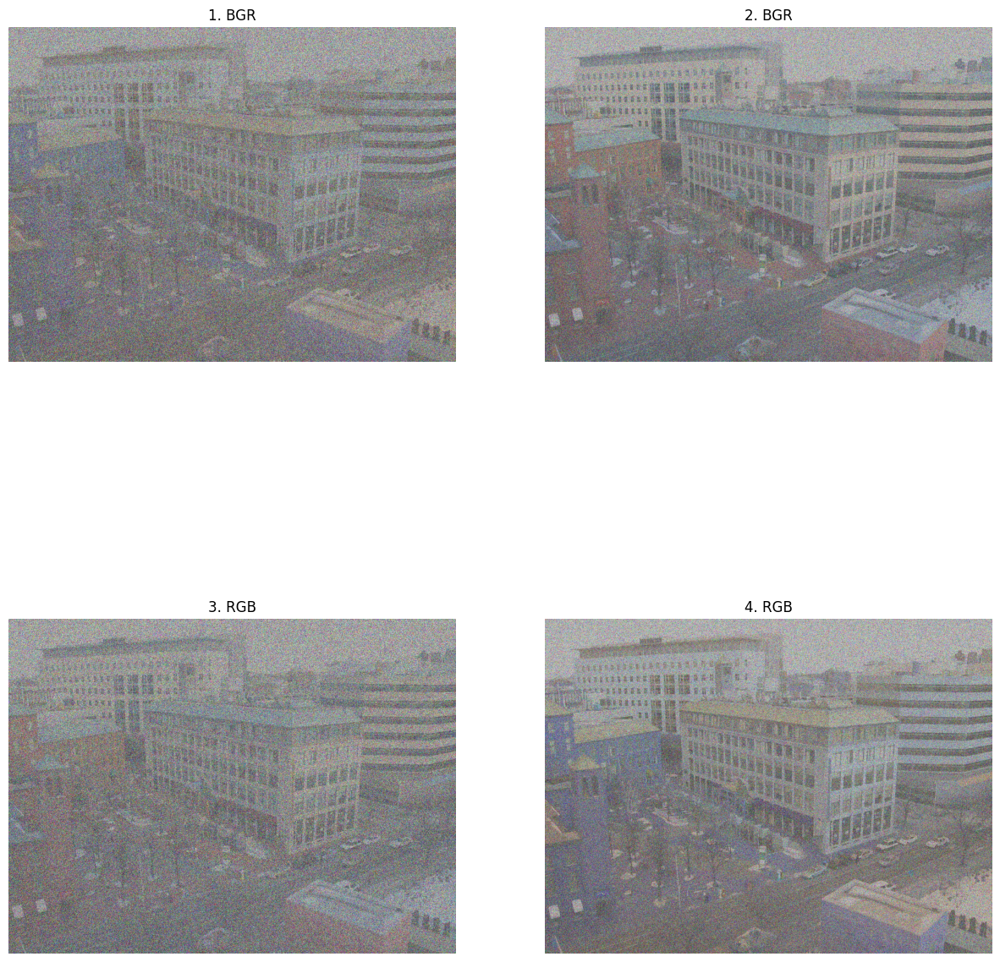

In [5]:
show_multi_img(2,2,(img_jpg,img_png,img_jpg_rgb,img_png_rgb),titles=['BGR','BGR','RGB','RGB'])

## Denoising

### Box Filter

In [6]:
img_png2 = img_png_rgb.copy()

In [7]:
boxFilter = cv2.boxFilter(img_png2,-1,(3,3),normalize = True)

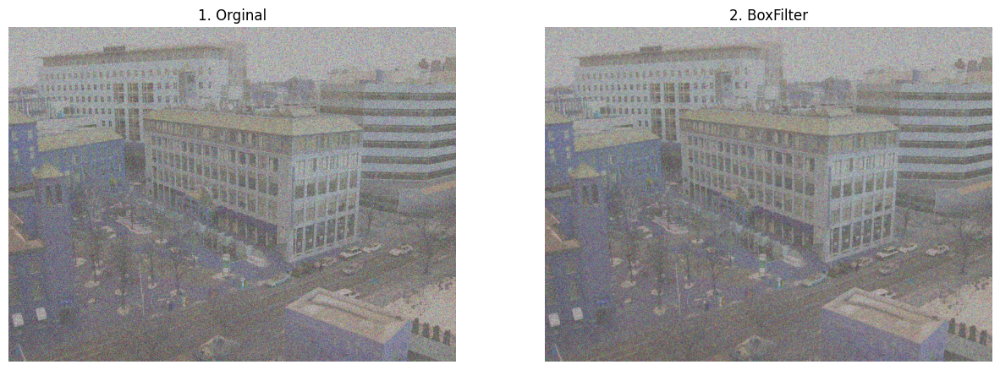

In [8]:
show_multi_img(1,2,(img_png_rgb,boxFilter),titles=['Orginal','BoxFilter'])

### Median Filter

In [10]:
medianImage = cv2.medianBlur(img_png_rgb,3)

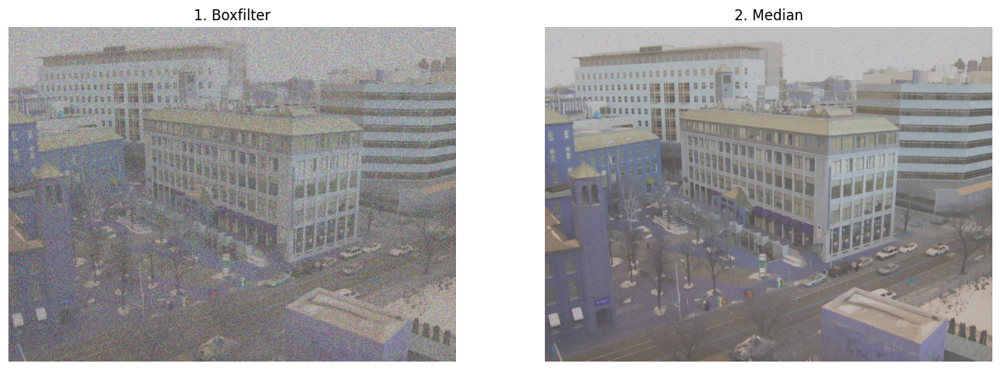

In [12]:
show_multi_img(1,2,(boxFilter,medianImage),titles=['Boxfilter',"Median"])

In [13]:
medianImage2 = cv2.medianBlur(medianImage,5)

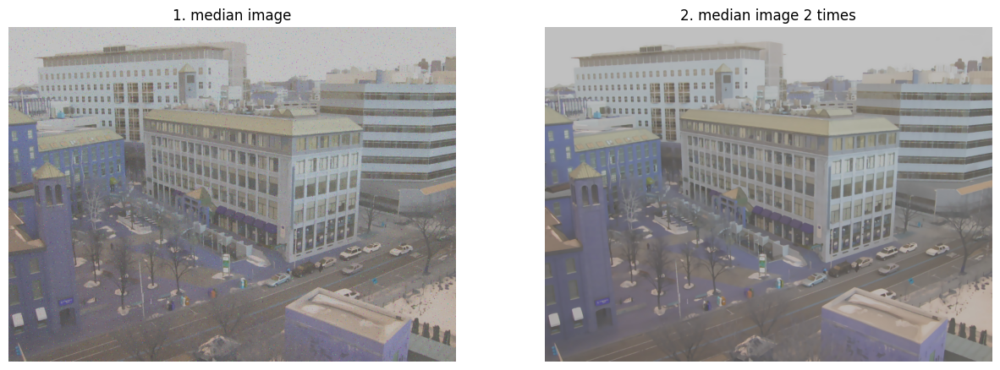

In [14]:
show_multi_img(1,2,(medianImage,medianImage2),titles=['median image','median image 2 times'])

### Gaussian Filter

In [15]:
gaussianImage = cv2.GaussianBlur(img_png_rgb,(3,3),0)

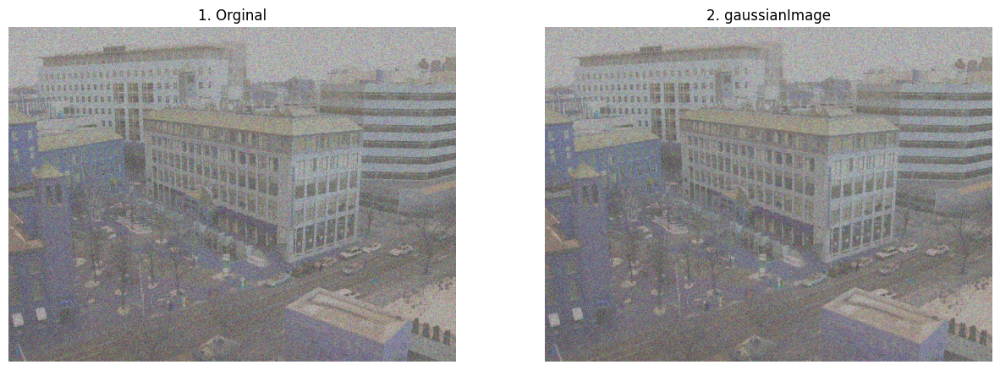

In [16]:
show_multi_img(1,2,(img_png_rgb,gaussianImage),titles=['Orginal','gaussianImage'])

In [17]:
gaussianImage2 = cv2.GaussianBlur(medianImage,(3,3),0)

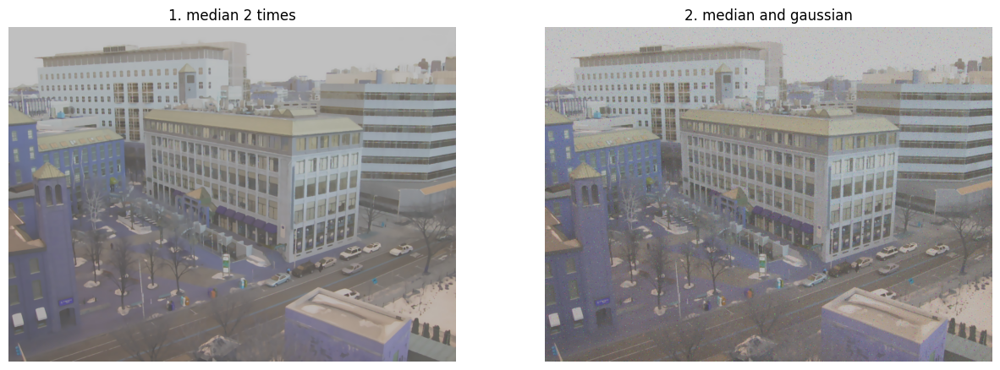

In [18]:
show_multi_img(1,2,(medianImage2,gaussianImage2),titles= ['median 2 times','median and gaussian'])

In [19]:
medianImageJPG = cv2.medianBlur(img_jpg_rgb,3)

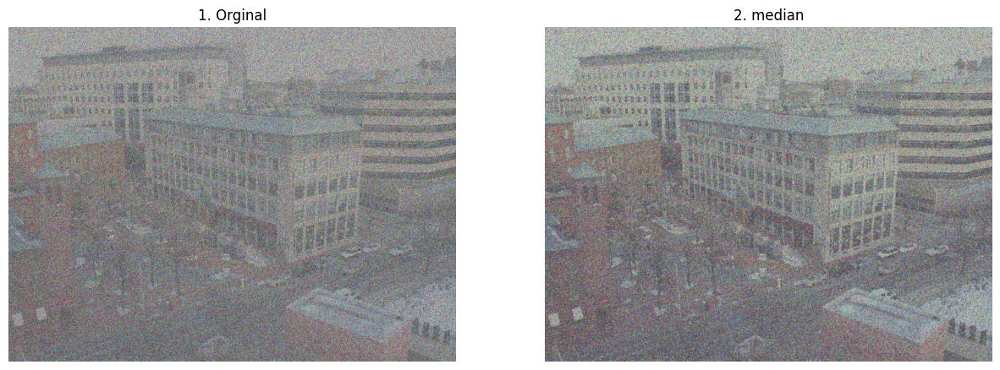

In [20]:
show_multi_img(1,2,(img_jpg_rgb,medianImageJPG),titles=['Orginal','median'])

In [21]:
medianImageJPG2 = cv2.medianBlur(medianImageJPG,5)

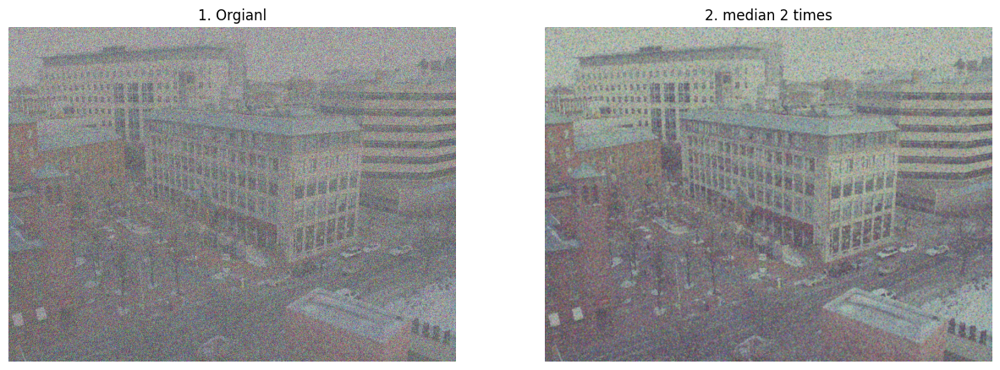

In [22]:
show_multi_img(1,2,(img_jpg_rgb,medianImageJPG2),titles=['Orgianl',"median 2 times"])

## CLAHE

In [23]:
r,g,b = cv2.split(medianImage2)

In [24]:
clahe = cv2.createCLAHE(clipLimit = 50)

In [25]:
clahe_r = clahe.apply(r)
clahe_b = clahe.apply(b)
clahe_g = clahe.apply(g)

In [28]:
outPut = cv2.merge((clahe_r,clahe_g,clahe_b))

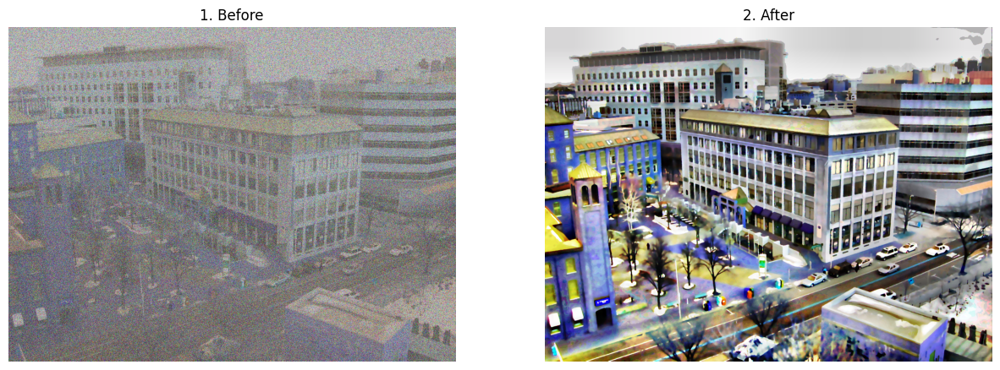

In [29]:
show_multi_img(1,2,(img_png_rgb,outPut),titles=['Before','After'])

In [30]:
def denoise(img):
    medianImage = cv2.medianBlur(img,3)
    medianImage2 = cv2.medianBlur(medianImage,5)
    r,g,b = cv2.split(medianImage2)
    clahe = cv2.createCLAHE(clipLimit = 50)
    clahe_r = clahe.apply(r)
    clahe_g = clahe.apply(g)
    clahe_b = clahe.apply(b)
    outPut = cv2.merge((clahe_r,clahe_g,clahe_b))
    show_multi_img(1,2,(img,outPut),titles=['Before','After'])

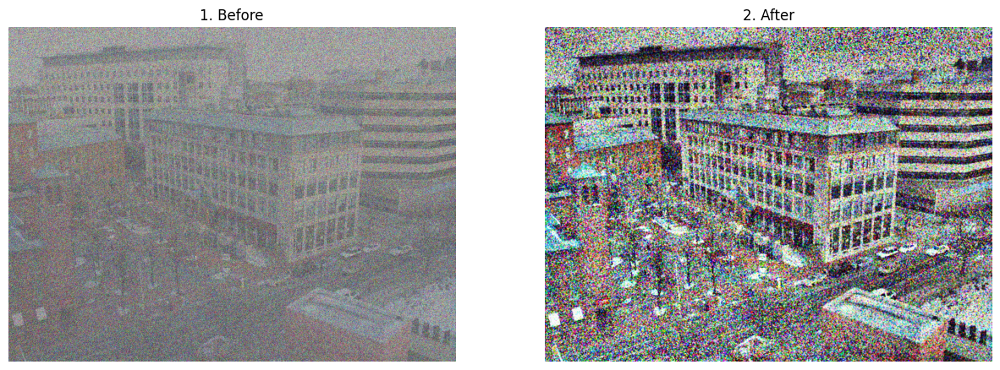

In [31]:
denoise(img_jpg_rgb)